# Assignment 2: Multi-View Geometry

### Comment: most of the written problems are designed to help with the coding part (structure-from-motion). Thus, they should be solved first. Your coding part will require figuring out how to work with numpy arrays (e.g. slicing, broadcasting). If you are new to numpy, this could be tricky. I can recommend working on small test cases. For debugging, print arrays before and after slicing (etc.) to verify that the result is correct.  

## Problem 1
### Prove that epipoles in two images obtained by the same camera during "translating" motion (no rotation) have exactly the same location in both images. 

Solution:

Let $C_1$ and $C_2$ be the world coordinate system points of the optical center of the camera in images 1 and 2 respectively. They are four-vectors for the homogeneous representation of 3D points.

We know that any projection matrix $P$ is composed of a 3x3 intrinsic matrix $K$, a 3x3 rotation matrix $R$, and a 3x1 translation vector $T$ such that $P$ is $P = K \left[R|T\right]$. We can assume calibrated cameras with $K = I$ without loss of generality. This means $P = \left[R|T\right]$.

The rotation matrix describes how a vector in the world coordinate system must be rotated to match the cameras coordinate system, but because there is no rotation, $R$ is the 3x3 Identity Matrix $I$. This means $P = \left[I|T\right]$.

Next, the translation vector describes how the camera optical center must be translated according to its own coordinate system to match the world coordinate system origin. This means every translation vector $T$ **can be written as** $T = -RC$ where the vector $C$ (which describes the position of the camera optical center in the world coordinate system) is rotated to match the camera coordinate system and flipped.

Further, we know that an epipole is the point where $C_2$ projects onto $C_1$'s image plane. In general, an epipole can be obtained using the projection matrix to project the optical center from the second image onto the image plane corresponding to the first image. Therefore, let $e_1$ and $e_2$ be the epipoles obtained in the first and second images respectively. Likewise, let $P_1$ and $P_2$ be the projection matrices for the first and second images respectively. This gives the following:

$$ e_1 = P_1 C_2 $$
$$ e_2 = P_2 C_1 $$
$$P_1 = \left[I|T_1\right]$$
$$P_2 = \left[I|T_2\right]$$

The translation vector $T$ is the vector in the camera's coordinate system from the optical center to the world coordinate origin. If the vector $C$, in world coordinates, points from the world coordate origin to the camera's optical center, then we can rotate and flip it to get the vector $T$ such that $T = -RC$. This leads us to the equations $T_1 = -RC_1$ and $T_2 = -RC_2$. With no rotation this simplifies to $T_1 = -C_1$ and $T_2 = -C_2$.

So we can write:

$$\begin{aligned}
e_1 &= P_1 C_2 \\
    &= \left[R|T_1 \right] C_2 \\
    &= \left[I|T_1 \right] C_2 \\
    &= I C_2 + T_1  \\
    &= C_2 + T_1  \\
    &= C_2 + (- C_1)  \\
    &= C_2 - C_1  \\
\end{aligned}$$

We know any homogeneous 2D point, $\left[\begin{array}{cc} X \\ Y \\ Z \end{array}\right]$ is equal to $\left[\begin{array}{cc} -X \\ -Y \\ -Z \end{array}\right]$. Therefore using this fact we can say that **non-algebraically** $e_1 = -e_1$ when $e_1$ is a homogenours 2D points. This allows us to make the following non-algebraic jump:

$$\begin{aligned}
e_1 &= -e_1 \\
    &= C_1 - C_2 \\
    &= I C_1 + (- C_2)  \\
    &= I C_1 + T_2  \\
    &= \left[I|T_2 \right] C_1 \\
    &= \left[R|T_2 \right] C_1 \\
    &= e_2 \\
\end{aligned}$$

i.e.

$$ e_1 = e_2 $$

This makes sense, because with no rotation and only translation the two image planes are parallel and so the baseline should arrive at both planes at the same angle.

In conclusion, when there is no rotation, the epipoles in two images obtained by the same camera during "translating" have exactly the same location in both images.

## Problem 2
### Assuming a $calibrated$ camera (that is, $K=I$) and its two views corresponding to projection matrices $P_1=[I|0]$ and $P_2=[R|T]$ w.r.t. some world coordinate system, show formulas for coordinates of the following 3D points (in the same world coordinate system):

#### (a) optical center for the first view: $C_1=$ 

Since $C_1$ is the optical center of camera 1, if we were to project $C_1$ onto the coordinate system of camera 1 we would get the origin point: the 3D point $(0, 0, 0)$. Its optical center is the origin of the camera 1 coordinate system.

$$ \left[\begin{array}{cc} 0 \\ 0 \\ 0 \end{array}\right] = P_1 C_1 $$

Expanding on this formula:

$$\begin{aligned}
\left[\begin{array}{cc} 0 \\ 0 \\ 0 \end{array}\right] &= P_1 C_1 \\
                                                       &= \left[I|0\right] C_1 \\
                                                       &= I C_1 + 0 \\
                                                       &= C_1 \\
\end{aligned}$$

Therefore,

$$ C_1 = \left[\begin{array}{cc} 0 \\ 0 \\ 0 \end{array}\right]$$

#### (b) image center for the first view: $Q_1=$

The image center for the first view occurs at the 2D point $(0,0)$. In homogenous representation this is $(0,0,1)$. Because these are normalized cameras, the 3D component matches the homogenous representation so that the 3D poin is $(0,0,1)$. The z-component is 1 because the cameras are calibrated.

We are looking for the world coordinate system point $Q_1$ such that when we project it onto the camera 1 coordinate system we get $\left(0, 0, 1\right)$. i.e.

$$ \left[\begin{array}{cc} 0 \\ 0 \\ 1 \end{array}\right] = P_1 Q_1 $$

Expanding on this formula:

$$\begin{aligned}
\left[\begin{array}{cc} 0 \\ 0 \\ 1 \end{array}\right] &= P_1 Q_1 \\
                                                       &= \left[I|0\right] Q_1 \\
                                                       &= I Q_1 + 0 \\
                                                       &= Q_1 \\
\end{aligned}$$

Therefore,

$$ Q_1 = \left[\begin{array}{cc} 0 \\ 0 \\ 1 \end{array}\right]$$


#### (c) optical center for the second view: $C_2=$

Since $C_2$ is the optical center of camera 2, if we were to project $C_2$ onto the coordinate system of camera 2 we would get the origin point: the 3D point $(0, 0, 0)$. Its optical center is the origin of the camera 2 coordinate system.

$$ \left[\begin{array}{cc} 0 \\ 0 \\ 0 \end{array}\right] = P_2 C_2 $$

Expanding on this formula:

$$\begin{aligned}
\left[\begin{array}{cc} 0 \\ 0 \\ 0 \end{array}\right] &= P_2 C_2 \\
                                                       &= \left[R|T\right] C_2 \\
                                                       &= R C_2 + T \\
\left[\begin{array}{cc} 0 \\ 0 \\ 0 \end{array}\right] - T &= R C_2 \\
R^{-1} \cdot - T &= C_2 \\
\end{aligned}$$

Therefore,

$$ C_2 = R^{-1} \cdot - T$$

#### (d) image center for the second view: $Q_2=$

The image center for the first view occurs at the 2D point $(0,0)$. In homogenous representation this is $(0,0,1)$. Because these are normalized cameras, the 3D component matches the homogenous representation so that the 3D poin is $(0,0,1)$. The z-component is 1 because the cameras are calibrated.

We are looking for the world coordinate system point $Q_2$ such that when we project it onto the camera 1 coordinate system we get $\left(0, 0, 1\right)$. i.e.

$$ \left[\begin{array}{cc} 0 \\ 0 \\ 1 \end{array}\right] = P_2 Q_2 $$

Expanding on this formula:

$$\begin{aligned}
\left[\begin{array}{cc} 0 \\ 0 \\ 1 \end{array}\right] &= P_2 Q_2 \\
                                                       &= \left[R|T\right] Q_2 \\
                                                       &= R Q_2 + T \\
\left[\begin{array}{cc} 0 \\ 0 \\ 1 \end{array}\right] - T &= R Q_2 \\
R^{-1} \left( \left[\begin{array}{cc} 0 \\ 0 \\ 1 \end{array}\right] - T \right) &= Q_2 \\
\end{aligned}$$

Therefore,

$$ Q_2 = R^{-1} \left( \left[\begin{array}{cc} 0 \\ 0 \\ 1 \end{array}\right] - T \right)$$

## Problem 3
### Using the same set up as in problem 2, show formulas for normalized coordinates of the following image points:

#### (a) epipole in the first camera image: $e_1=$

Since we know that the epipole on the image plane of camera 1 can be found by projecting the optical center of camera 2 $C_2$ onto the camera 1 coordinate system, we can write the following:

$$\begin{aligned}
e_1 &= P_1 C_2 \\
    &= \left[I|0\right] C_2 \\
    &= I C_2 + 0 \\
    &= C_2 \\
\end{aligned}$$

Using the formula for $C_2$ as in problem 2:

$$\begin{aligned}
e_1 &= \left( R^{-1} \cdot  - T \right) \\
\end{aligned}$$

Therefore the formula for the normalized coordinate of $e_1$ is $e_1 = R^{-1} \cdot - T$.


#### (b) epipole in the second camera image: $e_2=$

Since we know that the epipole on the image plane of camera 2 can be found by projecting the optical center of camera 1 $C_1$ onto the camera 2 coordinate system, we can write the following:

$$\begin{aligned}
e_2 &= P_2 C_1 \\
    &= \left[R|T\right] C_1 \\
    &= R C_1 + T \\
\end{aligned}$$

Using the formula for $C_1$ as in problem 2:

$$\begin{aligned}
e_2 &= R \left( \left[\begin{array}{cc} 0 \\ 0 \\ 0 \end{array}\right] \right) + T \\
e_2 &= T \\
\end{aligned}$$

Therefore the formula for the normalized coordinate of $e_2$ is $e_2 = T$.

## Problem 4 (homogeneous and non-homogeneous line representations)
###  Lines in 2D images can be represented "homogeneously" as 3-vectors $l=[l_1,l_2,l_3]^T$ that give equation $l^T x=0$ for homogeneous points $x=[x_1,x_2,x_3]^T \;\in {\cal P}^2$ forming a line. Given $l$, what are the values of scalar parameters $a$, $b$ in the line equation $v=au+b$ for the same 2D points based on their regular (nonhomogeneous) representation $(u,v)=(\frac{x_1}{x_3},\frac{x_2}{x_3})$ in ${\cal R}^2$? 
#### $a=\frac{-l_1}{l_2}$
#### $b=\frac{-l_3}{l_2}$

## Problem 5 (epipolar lines in normalized and non-normalized images)
### Given a matrix of intrinsic camera parameters $K$ and essential matrix $E$ between two views (A) and (B) such that $x_A^T E x_B=0$ for any corresponding points, write expressions for the following: 

#### (a) given homogeneous normalized point $x^{n}_B$ in image B, specify 3-vector $l_A^n$ describing the corresponding epipolar line of normalized points in image A:
####   $l_A^n= E x^{n}_B$
#### (b) given homogeneous normalized point $x^{n}_A$ in image A, specify 3-vector $l_B^n$ describing the corresponding epipolar line of normalized points in image B:
####   $l_B^n= E^T x^{n}_A$
#### (c) assuming line (3-vector) $l^n$ of normalized image points, what is a 3-vector representation $l$ for the line formed by the corresponding points on the real (unnormalized) camera image:
#### $l= K^{-T} l^n$

## Problem 6 (least squares for triangulation)
### Describe your approach to triangulating two matched feature points $x_a=[u_a,v_a,1]^T$ and $x_b=[u_b,v_b,1]^T$ in two views with given projection matrices $P_a$ and $P_b$. You should find 3D point $X=[X_1,X_2,X_3,1]^T$ and two scalars $w_a,w_b$ such that $P_a X\approx w_a x_a$ and $P_b X\approx w_b x_b$.  Be specific as you will need this for your programming part below. Use notation $M[i]$ to denote the $i$-th row vector of matrix $M$.
### You should use the first approach described for homograpy estimation in topic 6. In particualr, you can formulate the problem as $AX\approx 0$, define elements of $4x4$ matrix $A$, convert the problem to an overdetermined system of 4 linear equations $A_{1:3}[X_1,X_2,X_3]^T \approx - A_{4}$, and specify its solution minimizing the sum of squared errors.
### Can you characterize geometrically the case when your solution satisfies $A_{1:3}[X_1,X_2,X_3]^T = - A_{4}$ exactly?

Solution:

At first it seems that we are trying to solve two different systems of equations:

$$\begin{aligned}
P_a X &\approx w_a x_a
\end{aligned}$$

and

$$\begin{aligned}
P_b X &\approx w_b x_b
\end{aligned}$$

However, they both have $X$ in common, so we can stack the projection matrices $P_a$ and $P_b$ ontop of each other and the scaled features $w_a x_a$ and $w_b x_b$ to have only one system of equations:

$$\begin{aligned}
\left[\begin{array}{cc} P_a \\ P_b \end{array}\right] X &\approx \left[\begin{array}{cc} w_a x_a \\ w_b x_b \end{array}\right] \\
\left[\begin{array}{cc} P_a[1] \\ P_a[2] \\ P_a[3] \\ P_b[1] \\ P_b[2] \\ P_b[3] \\ \end{array}\right] \left[\begin{array}{cc} X_1 \\ X_2 \\ X_3 \\ 1 \end{array}\right]  &\approx \left[\begin{array}{cc} w_a u_a \\ w_a v_a \\ w_a \\ w_b u_b \\ w_b v_b \\ w_b \\ \end{array}\right] \\
\end{aligned}$$

This is an system with 6 equation and 5 unknowns. We can simply this equation by directly solving for $w_a$ and $w_b$:

$$\begin{aligned}
P_a[3] \left[ \begin{array}{cc} X_1 \\ X_2 \\ X_3 \\ 1 \\ \end{array} \right] &= w_a \\
P_b[3] \left[ \begin{array}{cc} X_1 \\ X_2 \\ X_3 \\ 1 \\ \end{array} \right] &= w_b \\
\end{aligned}$$

This allows us to eliminate the rows used to solve for $w_a$ and $w_b$ and rewrite them in terms of the other unknowns:

$$\begin{aligned}
\left[\begin{array}{cc} P_a[1] \\ P_a[2] \\ P_a[3] \\ P_b[1] \\ P_b[2] \\ P_b[3] \\ \end{array}\right] \left[\begin{array}{cc} X_1 \\ X_2 \\ X_3 \\ 1 \end{array}\right]  &\approx \left[\begin{array}{cc} w_a u_a \\ w_a v_a \\ w_a \\ w_b u_b \\ w_b v_b \\ w_b \\ \end{array}\right] \\
\left[\begin{array}{cc} P_a[1] \\ P_a[2] \\ P_b[1] \\ P_b[2] \\ \end{array}\right] \left[\begin{array}{cc} X_1 \\ X_2 \\ X_3 \\ 1 \end{array}\right]  &\approx \left[\begin{array}{cc} w_a u_a \\ w_a v_a \\ w_b u_b \\ w_b v_b \\ \end{array}\right] \\
\left[
    \begin{array}{cc}
        P_a[1] \\
        P_a[2] \\
        P_b[1] \\
        P_b[2] \\
    \end{array}
\right]
\left[
    \begin{array}{cc}
        X_1 \\
        X_2 \\
        X_3 \\
        1
    \end{array}
\right] &\approx \left[
                    \begin{array}{cc}
                        \left(
                            P_a[3] \left[
                                \begin{array}{cc}
                                    X_1 \\
                                    X_2 \\
                                    X_3 \\
                                    1 \\
                                \end{array}
                                    \right]
                        \right) u_a \\
                        \left(
                            P_a[3] \left[
                                \begin{array}{cc}
                                    X_1 \\
                                    X_2 \\
                                    X_3 \\
                                    1 \\
                                \end{array}
                                   \right]
                        \right) v_a \\
                        \left(
                            P_b[3] \left[
                                \begin{array}{cc}
                                    X_1 \\
                                    X_2 \\
                                    X_3 \\
                                    1 \\
                                \end{array}
                                    \right]
                        \right) u_b \\
                        \left(
                            P_b[3] \left[
                                \begin{array}{cc}
                                    X_1 \\
                                    X_2 \\
                                    X_3 \\
                                    1 \\
                                \end{array}
                                    \right]
                        \right) v_b \\
                    \end{array}
                 \right] \\
\left[
    \begin{array}{cc}
        P_a[1] \\
        P_a[2] \\
        P_b[1] \\
        P_b[2] \\
    \end{array}
\right]
\left[
    \begin{array}{cc}
        X_1 \\
        X_2 \\
        X_3 \\
        1
    \end{array}
\right] &\approx \left[
                    \begin{array}{cc}
                        u_aP_a[3] \\
                        v_aP_a[3] \\
                        u_bP_b[3] \\
                        v_bP_b[3] \\
                    \end{array}
                 \right] \left[
                    \begin{array}{cc}
                        X_1 \\
                        X_2 \\
                        X_3 \\
                        1
                    \end{array}
                 \right] \\
\left[
    \begin{array}{cc}
        P_a[1] \\
        P_a[2] \\
        P_b[1] \\
        P_b[2] \\
    \end{array}
\right]
\left[
    \begin{array}{cc}
        X_1 \\
        X_2 \\
        X_3 \\
        1
    \end{array}
\right] - \left[
            \begin{array}{cc}
                u_aP_a[3] \\
                v_aP_a[3] \\
                u_bP_b[3] \\
                v_bP_b[3] \\
            \end{array}
         \right] \left[
                    \begin{array}{cc}
                        X_1 \\
                        X_2 \\
                        X_3 \\
                        1
                    \end{array}
                 \right] &\approx 0 \\
\left(
\left[
    \begin{array}{cc}
        P_a[1] \\
        P_a[2] \\
        P_b[1] \\
        P_b[2] \\
    \end{array}
\right] -
\left[
    \begin{array}{cc}
        u_aP_a[3] \\
        v_aP_a[3] \\
        u_bP_b[3] \\
        v_bP_b[3] \\
    \end{array}
\right]
\right)
\left[
    \begin{array}{cc}
        X_1 \\
        X_2 \\
        X_3 \\
        1
    \end{array}
\right] &\approx 0 \\
\left[
    \begin{array}{cc}
        \left(P_a[1] - u_aP_a[3]\right) \\
        \left(P_a[2] - v_aP_a[3]\right)\\
        \left(P_b[1] - u_bP_b[3]\right) \\
        \left(P_b[2] - v_bP_b[3]\right) \\
    \end{array}
\right]
\left[
    \begin{array}{cc}
        X_1 \\
        X_2 \\
        X_3 \\
        1
    \end{array}
\right] &\approx 0 \\
\end{aligned}$$

This is a system with 4 equation and 3 unknowns. Finally we use least squares on the following equation:

$$ {min}_{
\left[
    \begin{array}{cc}
        X_1 \\
        X_2 \\
        X_3 \\
    \end{array}
\right]
}
\left|\left|
\left[
    \begin{array}{cc}
        P_a[1] - u_aP_a[3] \\
        P_a[2] - v_aP_a[3] \\
        P_b[1] - u_bP_b[3] \\
        P_b[2] - v_bP_b[3] \\
    \end{array}
\right]
\left[
    \begin{array}{cc}
        X_1 \\
        X_2 \\
        X_3 \\
        1
    \end{array}
\right]
\right|\right|^2 \approx 0 \\ $$

After finding the best solution for the 3 unknowns $\left[\begin{array}{cc} X_1 \\ X_2 \\ X_3 \end{array}\right]$ we can directly solve for the 2 unknown scalars $w_a$ and $w_b$ using the equations as above. 

Geometrically, the case where the found solution $\left[\begin{array}{cc} X_1 \\ X_2 \\ X_3 \end{array}\right]$ satisfies the least sqaures equation exactly (equals 0 exactly) is when the two rays cast through the respective optical centers and feature points of each camera **perfectly** intersect with high floating point precision. This means that the features points (i.e. $x_a$ and $x_b$) are precisely on the epipolar lines. Further, the 4th equation could be written in terms of the other 3 equations in that perfect case. However in practice this is rarely true which is why we use least squares to try and minimize the error.

## Probelm 7 (the programming part)
# Structure from Motion 
#### NOTE: Steps 0-3 and 10 are given, other steps needs to be implemented.
### Step 0: Loading two camera views and camera's intrinsic matrix $K$ 

<IPython.core.display.Javascript object>


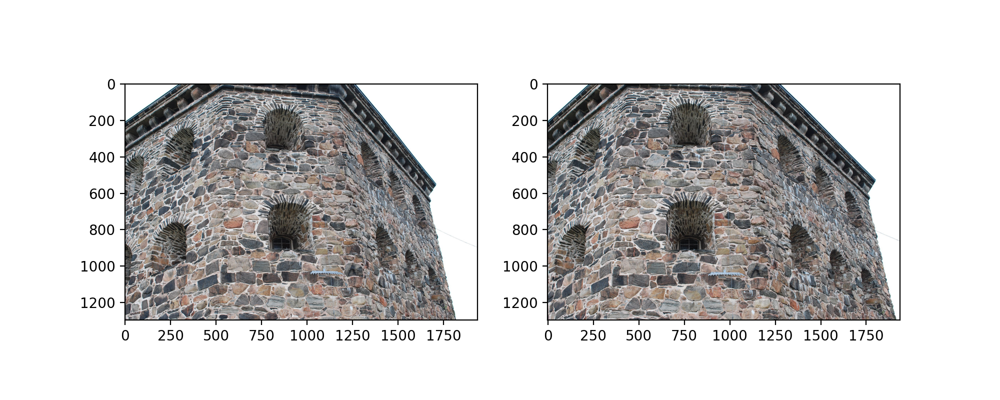

In [1]:
%matplotlib notebook

import numpy as np
import numpy.linalg as la
import matplotlib
import matplotlib.image as image
import matplotlib.pyplot as plt
from skimage.feature import (corner_harris, corner_peaks, plot_matches, BRIEF, match_descriptors)
from skimage.transform import warp, ProjectiveTransform, EssentialMatrixTransform, FundamentalMatrixTransform
from skimage.color import rgb2gray
from skimage.measure import ransac

# Indicate (E) inlier matches in image 1 and image 2
# loading two images (two camera views) and the corresponding matrix K (intrinsic parameters)
imL = image.imread("images/kronan1.jpg")
imR = image.imread("images/kronan2.jpg")
imLgray = rgb2gray(imL)
imRgray = rgb2gray(imR)

K = 1.0e+03 * np.array([[2.3940, -0.0000,    0.9324],
                        [     0,  2.3981,    0.6283],
                        [     0,       0,    0.0010]])


plt.figure(0,figsize = (10, 4))
ax81 = plt.subplot(121)
plt.imshow(imL)
ax82 = plt.subplot(122)
plt.imshow(imR)
plt.show()

### Step 1: Feature detection (e.g. corners) 

the number of features in images 1 and 2 are  1576 and  1661


<IPython.core.display.Javascript object>


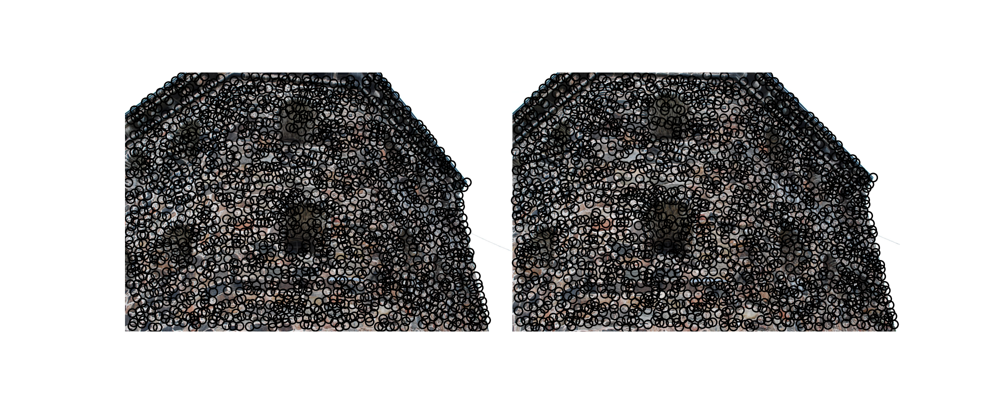

In [2]:
# NOTE: corner_peaks and many other feature extraction functions return point coordinates as (y,x), that is (rows,cols)
keypointsL = corner_peaks(corner_harris(imLgray), threshold_rel=0.001, min_distance=15)
keypointsR = corner_peaks(corner_harris(imRgray), threshold_rel=0.001, min_distance=15)


print ('the number of features in images 1 and 2 are {:5d} and {:5d}'.format(keypointsL.shape[0],keypointsR.shape[0]))

fig = plt.figure(1,figsize = (10, 4))
axA = plt.subplot(111)
plt.gray()
matchesLR = np.empty((0,2))
plot_matches(axA, imL, imR, keypointsL, keypointsR, matchesLR)
axA.axis('off')

plt.show()

### Step 2: Feature matching (e.g. BRIEF descriptor, a variant of SURF, SIFT, etc)

the number of matches is 981


<IPython.core.display.Javascript object>


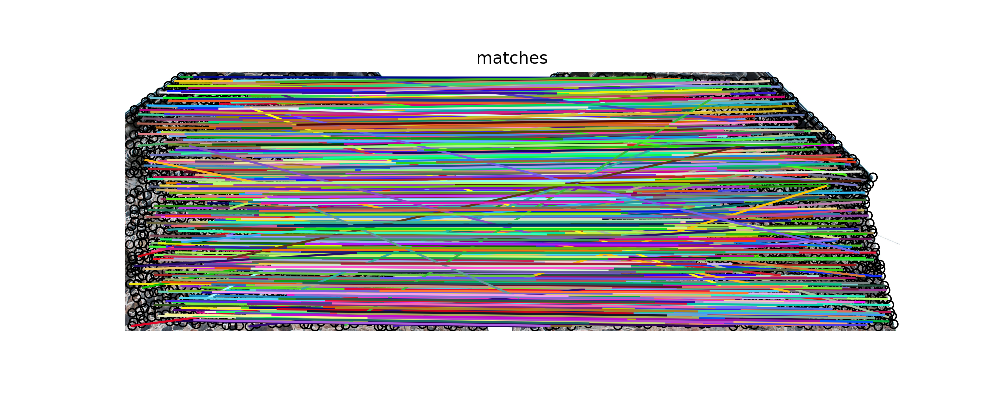

In [3]:
extractor = BRIEF()

extractor.extract(imLgray, keypointsL)
keypointsL = keypointsL[extractor.mask]         
descriptorsL = extractor.descriptors

extractor.extract(imRgray, keypointsR)
keypointsR = keypointsR[extractor.mask]
descriptorsR = extractor.descriptors

matchesLR = match_descriptors(descriptorsL, descriptorsR, cross_check=True)

print ('the number of matches is {:2d}'.format(matchesLR.shape[0]))

fig = plt.figure(2,figsize = (10, 4))
axA = plt.subplot(111)
axA.set_title("matches")
plt.gray()
plot_matches(axA, imL, imR, keypointsL, keypointsR, matchesLR) #, matches_color = 'r')
axA.axis('off')

plt.show()

### Step 3: Fundamental Matrix estimation using RANSAC

the number of inliers is 179


<IPython.core.display.Javascript object>


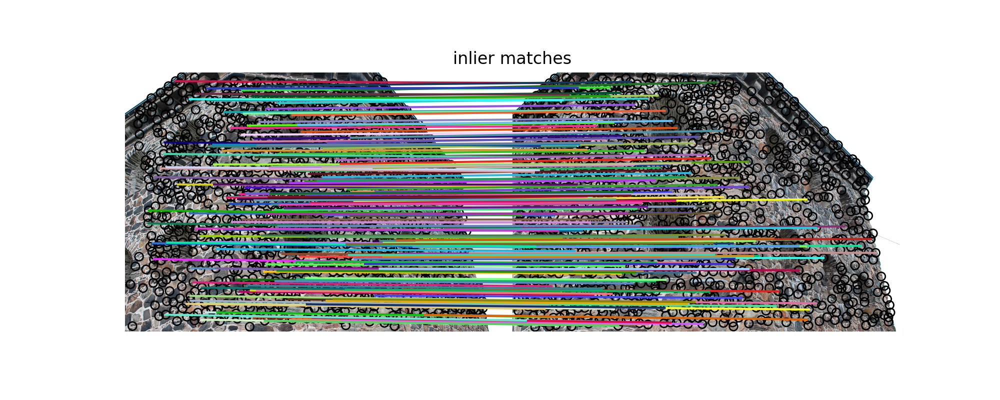

In [4]:
ptsL1 = []
ptsR1 = []
for i in matchesLR:
    ptsL1.append(keypointsL[i[0]])
    ptsR1.append(keypointsR[i[1]])
ptsL1 = np.array(ptsL1)
ptsR1 = np.array(ptsR1)

# swapping columns using advanced indexing https://docs.scipy.org/doc/numpy/reference/arrays.indexing.html#advanced-indexing
# This changes point coordinates from (y,x) in ptsL1/ptsR1 to (x,y) in ptsL/ptsR
ptsL = ptsL1[:,[1, 0]]
ptsR = ptsR1[:,[1, 0]]

# robustly estimate fundamental matrix using RANSAC
F_trans, F_inliers = ransac(
    (ptsL, ptsR),
    FundamentalMatrixTransform,
    min_samples=8,
    residual_threshold=0.1,
    max_trials=1500
)
print ('the number of inliers is {:2d}'.format(np.sum(F_inliers)))

ind = np.ogrid[:ptsL.shape[0]]
FmatchesRansac = np.column_stack((ind[F_inliers],ind[F_inliers]))

fig = plt.figure(3,figsize = (10, 4))
axA = plt.subplot(111)
axA.set_title("inlier matches")
plt.gray()
# NOTE: function "plot matches" expects that keypoint coordinates are given as (y,x), that is (row, col)
plot_matches(axA, imL, imR, ptsL1, ptsR1, FmatchesRansac) #, matches_color = 'r')
axA.axis('off')
plt.show()

### singular values for F

In [5]:
F = F_trans.params
Uf,Sf,Vf = la.svd(F, full_matrices=False)
print (Sf)

[8.1556951e-02 6.1123769e-05 1.9135013e-19]


### Step 4: Epipolar lines from F

<IPython.core.display.Javascript object>


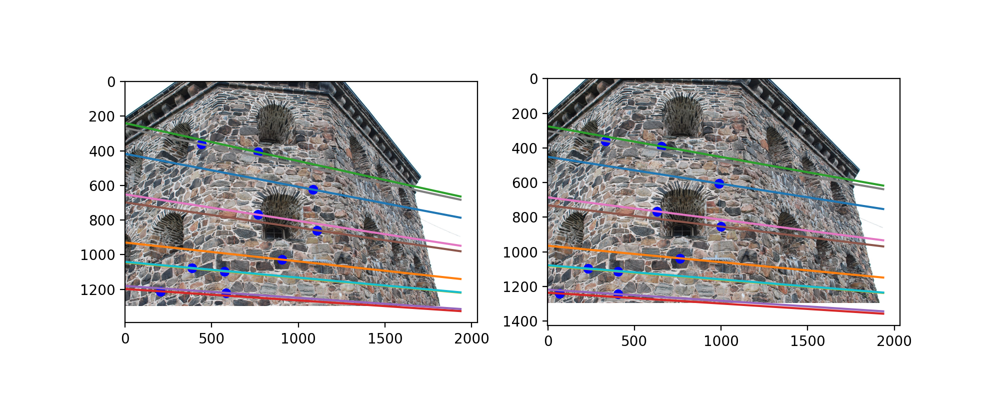

In [6]:
# Randomly select 10 matches (pairs of features in two images) from the set of inliers for F
ind_sample = np.random.choice(ind[F_inliers], 10, replace = False)

# Indicate these matching features in image 1 and image 2
plt.figure(4,figsize = (10, 4))
ax41 = plt.subplot(121)
plt.imshow(imL)
plt.plot(ptsL[ind_sample, 0], ptsL[ind_sample, 1], 'ob')
ax42 = plt.subplot(122)
plt.imshow(imR)
plt.plot(ptsR[ind_sample, 0], ptsR[ind_sample, 1], 'ob')

# generate epipolar line equations in image 2 (homogeneous 3-vectors l2 representing lines l2 x  = 0) 
# a. create an array of points sampled in images 1 and 2
ptsSampledL = ptsL[ind_sample]
ptsSampledR = ptsR[ind_sample]
# b. create an array of homogeneous points sampled in images 1 and 2
homogeneousPtsSampledL = np.c_[ptsSampledL, np.ones(ptsSampledL.shape[0])]
homogeneousPtsSampledR = np.c_[ptsSampledR, np.ones(ptsSampledR.shape[0])]
# c. create an array of the corresponding epipolar lines in images 1 and 2 
epipolarLinesL = np.array([F @ x for x in homogeneousPtsSampledL])
epipolarLinesR = np.array([x.T @ F for x in homogeneousPtsSampledR])


# for each feature (in both images) draw a corresponding epipolar line in the other image
# see Assignment 1 (line fitting part 1) for inspiration on how to visualize lines
# use ax41.plot and ax42.plot
x_vals = np.array([0,imL.shape[1]])
for l_vals in epipolarLinesL:
    ax42.plot(
        x_vals,
        ((x_vals * -1 * l_vals[0]) - l_vals[2]) / l_vals[1],
    )

for l_vals in epipolarLinesR:
    ax41.plot(
        x_vals,
        ((x_vals * -1 * l_vals[0]) - l_vals[2]) / l_vals[1],
    )

plt.show()

### Step 5: Camera Normalization and Essential Matrix estimation using RANSAC

the number of inliers is 762


<IPython.core.display.Javascript object>


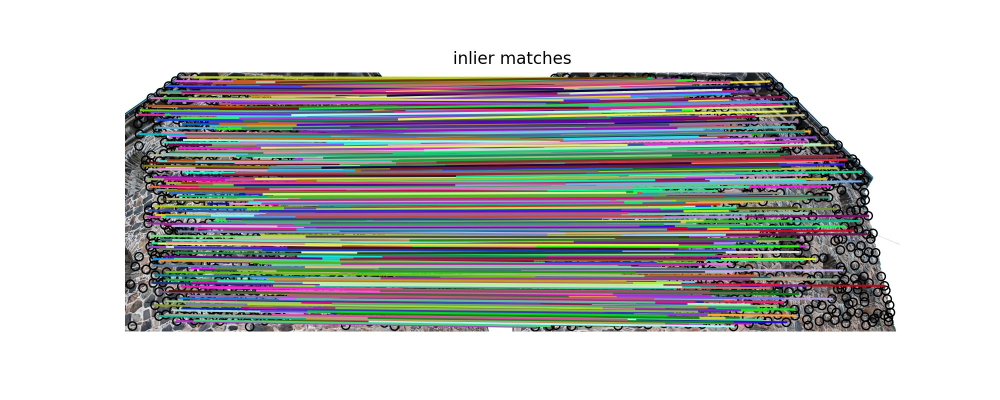

In [7]:
# normalization of points in two images using K (intrinsic parameters) e.g. in the following three steps
# a. convert original points to homogeneous 3-vectors (append "1" as a 3rd coordinate using np.append function)
# b. transform the point by applying the inverse of K
# c. convert homogeneous 3-vectors to 2-vectors (in R2)
n_ptsL = (
    la.pinv(K) @ np.append(ptsL, np.ones(ptsL.shape[0])[:, None], axis=1).T
).T
n_ptsL = np.delete(n_ptsL / n_ptsL[:, -1, None], -1, axis=1)
n_ptsR = (
    la.pinv(K) @ np.append(ptsR, np.ones(ptsR.shape[0])[:, None], axis=1).T
).T
n_ptsR = np.delete(n_ptsR / n_ptsR[:, -1, None], -1, axis=1)

# robustly estimate essential matrix using normalized points and RANSAC
E_trans, E_inliers = ransac(
    (n_ptsL, n_ptsR),
    EssentialMatrixTransform,
    min_samples=8,
    residual_threshold=0.0005,
    max_trials=5000,
)
num_inliers = np.sum(E_inliers)
print("the number of inliers is {:2d}".format(num_inliers))

ind = np.ogrid[: n_ptsL.shape[0]]
EmatchesRansac = np.column_stack((ind[E_inliers], ind[E_inliers]))

fig = plt.figure(5, figsize=(10, 4))
axA = plt.subplot(111)
axA.set_title("inlier matches")
plt.gray()
# NOTE: function "plot matches" expects that keypoint coordinates are given as (y,x), that is (row, col)
plot_matches(
    axA, imL, imR, ptsL1, ptsR1, EmatchesRansac
)  # , matches_color = 'r')
axA.axis("off")
plt.show()

### singular values for E
#### Hint: function $svd$ from $linalg$ returns transpose $V^T$, not $V$.  

In [8]:
E = E_trans.params
Ue,Se,Ve = la.svd(E)
print (Se)

[4.73431222e+00 4.64741210e+00 3.49950001e-16]


### Step 6: Epipolar Lines from E 

<IPython.core.display.Javascript object>


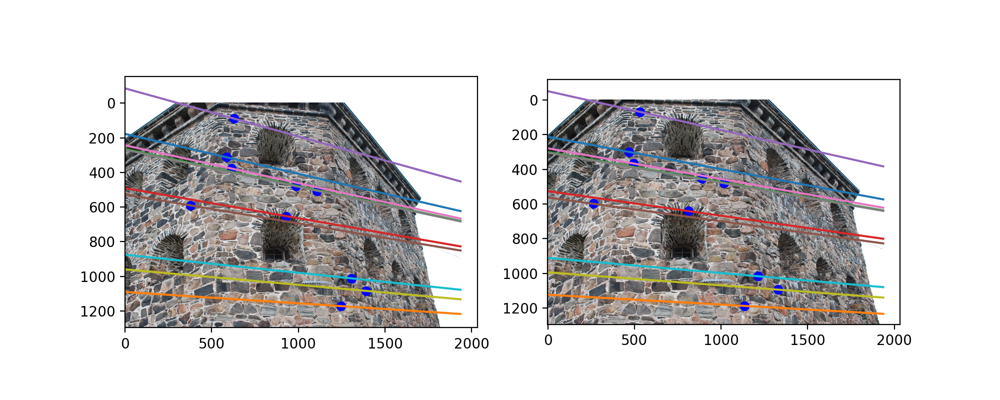

In [9]:
# Randomly select 10 matches (pairs of features in two images) from the set of inliers for E
ind_sample = np.random.choice(ind[E_inliers], 10, replace=False)

# Indicate these matching features in image 1 and image 2
plt.figure(6, figsize=(10, 4))
ax61 = plt.subplot(121)
plt.imshow(imL)
plt.plot(ptsL[ind_sample, 0], ptsL[ind_sample, 1], "ob")
ax62 = plt.subplot(122)
plt.imshow(imR)
plt.plot(ptsR[ind_sample, 0], ptsR[ind_sample, 1], "ob")

# # Another way to predict E with E Tilda (but it didn't have good results)
# print("E before: ", E)
# s1, s2 = la.pinv(np.array([[0.5, 0.5], [0.5, 0.5], [1, -1]])) @ np.hstack([Se[0:2], [0]])
# E = Ue @ (np.diag([s1 + s2, s1 + s2, 0]) / 2) @ Ve
# print("E now: ", E)
# print("Here are the s values: ", s1, s2)

# generate epipolar line equations in image 2 (homoheneous 3-vectors l2 representing lines l2 x  = 0)
# a. create an array of normalized points sampled in image 1
n_ptsL_sample = n_ptsL[ind_sample, :]
n_ptsR_sample = n_ptsR[ind_sample, :]
# b. create an array of homogeneous normalized points sampled in image 1
homogeneousPtsSampledL = np.c_[n_ptsL_sample, np.ones(n_ptsL_sample.shape[0])]
homogeneousPtsSampledR = np.c_[n_ptsR_sample, np.ones(n_ptsR_sample.shape[0])]
# c. create an array of the corresponding (uncalibrated) epipolar lines in image 2
epipolarLinesL = np.array(
    [la.pinv(K).T @ E @ x_n for x_n in homogeneousPtsSampledL]
)
epipolarLinesR = np.array(
    [x_n.T @ E @ la.pinv(K) for x_n in homogeneousPtsSampledR]
)


# for each feature (in both images) draw a correspoindiung epipolar line in the other image
# use ax61.plot and ax62.plot
x_vals = np.array([0, imL.shape[1]])
for l_vals in epipolarLinesL:
    ax62.plot(
        x_vals,
        -1 * ((x_vals * l_vals[0]) + l_vals[2]) / l_vals[1],
    )

for l_vals in epipolarLinesR:
    ax61.plot(
        x_vals,
        -1 * ((x_vals * l_vals[0]) + l_vals[2]) / l_vals[1],
    )

plt.show()

### Step 7: Camera rotation and translation (four solutions)

#### Factorize essential matrix $E=[T]_x R$ where $R$ is rotation and $T$ is a translation. Find solutions $R_1$, $R_2$ and $T_1$, $T_2$. Use camera 1 for world coordinates. Define projection matrix for camera 1 as $P_w = [I|0]$ and compute four projection matrices for the second camera $P_a$, $P_b$, $P_c$, $P_d$.
#### Hint 1: for array multiplication use $dot$ or $matmul$, never $*$. 
#### Hint 2: function  $svd$  from  $linalg$  returns  $V^T$ rather than $V$ (the 2nd orthogonal matrix in svd decomposition $E = USV^T$).
#### Warning: remember that python uses 0 as a starting index for the rows or columns in arrays. For example, $A[0]$ denotes the first row of matrix $A$, while $P_w[2]$ stands for the 3rd row of the corresponding projection matrix and $E[:,[1]]$ is the second column of the essential matrix. 


In [10]:
W = np.array([
    [0, -1, 0],
    [1, 0, 0],
    [0, 0, 1],
])

Ve_updated = Ve
if la.det(Ue @ Ve) == -1:
    Ve_updated[-1,:] = -1 * Ve_updated[-1,:]

R1 = Ue @ W @ Ve_updated
R2 = Ue @ W.T @ Ve_updated
T1 = Ue[:,-1]
T2 = -1 * Ue[:,-1]

# first camera matrix
Pw = np.append(np.eye(3), np.zeros(3)[:,None], axis=1)

# four possible matrices for the second camera
Pa = np.append(R1, T1[:,None], axis=1)
Pb = np.append(R1, T2[:,None], axis=1)
Pc = np.append(R2, T1[:,None], axis=1)
Pd = np.append(R2, T2[:,None], axis=1)

### Summary of Structure-from-Motion (the remaining steps 8-11): 
#### In these 3D reconstruction steps you should use the world coordinate system consistent with the projection matrices estimated in step 7. In all steps you should obtain solutions for all four distinct cases of the second camera: $P_a$, $P_b$, $P_c$, $P_d$. First, step 8 is to Implement least squares (you can use $svd$ or $inv$ functions) for "triangulating" 3D points corresponding to pairs of matched features that are inliers for estimated $E$ (i.e. consistent with the epipolar geometry). Make sure to use normalized coordinates for image points. Then (step 9) you will compute camera positioning (optical centers and calibrated image centers as 3D points) in the world coordinate system. This is used in data visualsation step 10 (fully implemented). That step visulaizes in 3D both camera positions (red - optcal centers, green - image centers) and triangulated points (blue) for four possible cases of the second camera. You should identify one case when solution has 3D points in front of both cameras. In the last step 11 you will project 3D points onto each camera, convert to uncalibrated coordinates, and display these projected points (use red) together with the original features (use blue). Observe if the are red and blue points are close in each image.
### Step 8: Triangulation (four solutions)

In [11]:
# Select normalized coordinates for matched features that are inliers for essential matrix E. 
# Form matrix A in equation AX=0 where X represent 4 vectors (homogeneous representation of 3D point).
# Use your solution for Problem 6.
# Each camera (projection matrix P) will define its own A  

# HINT: to keep it simple, first solve the problem for one match.
x_a = n_ptsL[E_inliers,:]
x_b = n_ptsR[E_inliers,:]

Aa = []
Ab = []
Ac = []
Ad = []

for i in range(num_inliers):
    Aa_i = np.vstack(
    [
        Pw[0] - x_a[i,0] * Pw[2],
        Pw[1] - x_a[i,1] * Pw[2],
        Pa[0] - x_b[i,0] * Pa[2],
        Pa[1] - x_b[i,1] * Pa[2],
    ])
    Ab_i = np.vstack(
    [
        Pw[0] - x_a[i,0] * Pw[2],
        Pw[1] - x_a[i,1] * Pw[2],
        Pb[0] - x_b[i,0] * Pb[2],
        Pb[1] - x_b[i,1] * Pb[2],
    ])
    Ac_i = np.vstack(
    [
        Pw[0] - x_a[i,0] * Pw[2],
        Pw[1] - x_a[i,1] * Pw[2],
        Pc[0] - x_b[i,0] * Pc[2],
        Pc[1] - x_b[i,1] * Pc[2],
    ])
    Ad_i = np.vstack(
    [
        Pw[0] - x_a[i,0] * Pw[2],
        Pw[1] - x_a[i,1] * Pw[2],
        Pd[0] - x_b[i,0] * Pd[2],
        Pd[1] - x_b[i,1] * Pd[2],
    ])
    Aa.append(Aa_i)
    Ab.append(Ab_i)
    Ac.append(Ac_i)
    Ad.append(Ad_i)

Aa = np.array(Aa)
Ab = np.array(Ab)
Ac = np.array(Ac)
Ad = np.array(Ad)

#### Solution using least squares: assume homogeneous 3D point $X=[X_1,X_2,X_3,1]$. Then, $AX=0$ gives 4 equations for 3 unknowns. Use approach 1 (inhomogeneous least squares) discussed for homography estimation (Topic 6).

In [12]:
# Nx3 matrices: N rows with 3D point coordinates for N reconstructed points (N=num_inliers)
Xa = []
Xb = []
Xc = []
Xd = []

for i in range(num_inliers):
    # least squares for solving linear system A_{0:2} X_{0:2} = - A_3 
    Aa_i_02 = Aa[i,:,:-1]       # the first 3 columns of 4x4 matrix A (3x4 is a typo)
    Aa_i_3  = Aa[i,:,-1][:,None]       # the last column on 4x4 matrix A
    Ab_i_02 = Ab[i,:,:-1]
    Ab_i_3  = Ab[i,:,-1][:,None]
    Ac_i_02 = Ac[i,:,:-1]
    Ac_i_3  = Ac[i,:,-1][:,None]
    Ad_i_02 = Ad[i,:,:-1]
    Ad_i_3  = Ad[i,:,-1][:,None]
    Xa_i = (la.pinv(Aa_i_02) @ (-1 * Aa_i_3))
    Xb_i = (la.pinv(Ab_i_02) @ (-1 * Ab_i_3))
    Xc_i = (la.pinv(Ac_i_02) @ (-1 * Ac_i_3))
    Xd_i = (la.pinv(Ad_i_02) @ (-1 * Ad_i_3))
    Xa.append(Xa_i)
    Xb.append(Xb_i)
    Xc.append(Xc_i)
    Xd.append(Xd_i)

Xa = np.array(Xa)
Xb = np.array(Xb)
Xc = np.array(Xc)
Xd = np.array(Xd)

### Step 9: Camera positioning in 3D  (four solutions)
#### In this step you will compute location of each cameras' optical center and its (calibrated) image center as points in 3D (world coordinate system). The next step 10 visulaizes the computed cameras' optical centers in red and image centers in green.

In [13]:
# camera's optical centers (for pair of cameras) as points in 3D world coordinate system
# 2x3 matrices: two rows with 3D point coordinates for the first and second camera
first_camera = la.pinv(Pw[:,:-1]) @ (np.zeros(3) - Pw[:,-1])
Ca = np.array(
    [
        first_camera,
        la.pinv(Pa[:,:-1]) @ (np.zeros(3) - Pa[:,-1])
    ]
)
Cb = np.array(
    [
        first_camera,
        la.pinv(Pb[:,:-1]) @ (np.zeros(3) - Pb[:,-1])
    ]
)
Cc = np.array(
    [
        first_camera,
        la.pinv(Pc[:,:-1]) @ (np.zeros(3) - Pc[:,-1])
    ]
)
Cd = np.array(
    [
        first_camera,
        la.pinv(Pd[:,:-1]) @ (np.zeros(3) - Pd[:,-1])
    ]
)

# calibrated/normalized image centers (for pair of cameras) as points in 3D world coordinate system
# 2x3 matrices: two rows with 3D po### Step 9: Cameras positions/orientations in 3D  (four solutions)int coordinates for the first and second camera
first_image_center = la.pinv(Pw[:,:-1]) @ (np.array([0, 0, 1]) - Pw[:,-1])
Qa = np.array(
    [
        first_image_center,
        la.pinv(Pa[:,:-1]) @ (np.array([0, 0, 1]) - Pa[:,-1])
    ]
)
Qb = np.array(
    [
        first_image_center,
        la.pinv(Pb[:,:-1]) @ (np.array([0, 0, 1]) - Pb[:,-1])
    ]
)
Qc = np.array(
    [
        first_image_center,
        la.pinv(Pc[:,:-1]) @ (np.array([0, 0, 1]) - Pc[:,-1])
    ]
)
Qd = np.array(
    [
        first_image_center,
        la.pinv(Pd[:,:-1]) @ (np.array([0, 0, 1]) - Pd[:,-1])
    ]
)

### Step 10 $\text{(fully implemented)}$: 3D visualization of cameras and triangulated points (four solutions)

<IPython.core.display.Javascript object>


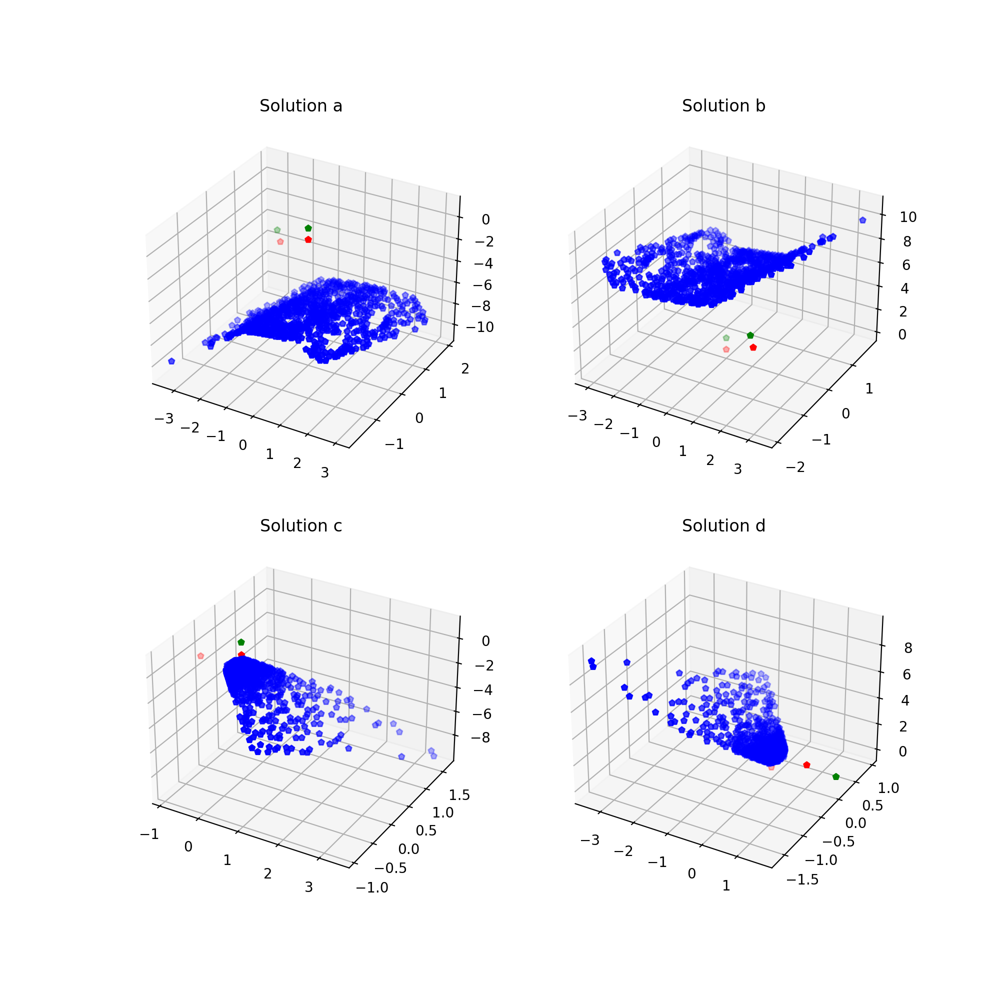

In [14]:
# visualization part
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(10,figsize = (10, 10))

ax10_1 = plt.subplot(221, projection='3d')
plt.title('Solution a')
ax10_1.scatter(Xa[:,0],Xa[:,1],Xa[:,2], c='b', marker='p')
ax10_1.scatter(Ca[:,0],Ca[:,1],Ca[:,2], c='r', marker='p')
ax10_1.scatter(Qa[:,0],Qa[:,1],Qa[:,2], c='g', marker='p')

ax10_2 = plt.subplot(222, projection='3d')
plt.title('Solution b')
ax10_2.scatter(Xb[:,0],Xb[:,1],Xb[:,2], c='b', marker='p')
ax10_2.scatter(Cb[:,0],Cb[:,1],Cb[:,2], c='r', marker='p')
ax10_2.scatter(Qb[:,0],Qb[:,1],Qb[:,2], c='g', marker='p')

ax10_3 = plt.subplot(223, projection='3d')
plt.title('Solution c')
ax10_3.scatter(Xc[:,0],Xc[:,1],Xc[:,2], c='b', marker='p')
ax10_3.scatter(Cc[:,0],Cc[:,1],Cc[:,2], c='r', marker='p')
ax10_3.scatter(Qc[:,0],Qc[:,1],Qc[:,2], c='g', marker='p')

ax10_4 = plt.subplot(224, projection='3d')
plt.title('Solution d')
ax10_4.scatter(Xd[:,0],Xd[:,1],Xd[:,2], c='b', marker='p')
ax10_4.scatter(Cd[:,0],Cd[:,1],Cd[:,2], c='r', marker='p')
ax10_4.scatter(Qd[:,0],Qd[:,1],Qd[:,2], c='g', marker='p')

plt.show()

### Step 11: Reprojection errors

<IPython.core.display.Javascript object>


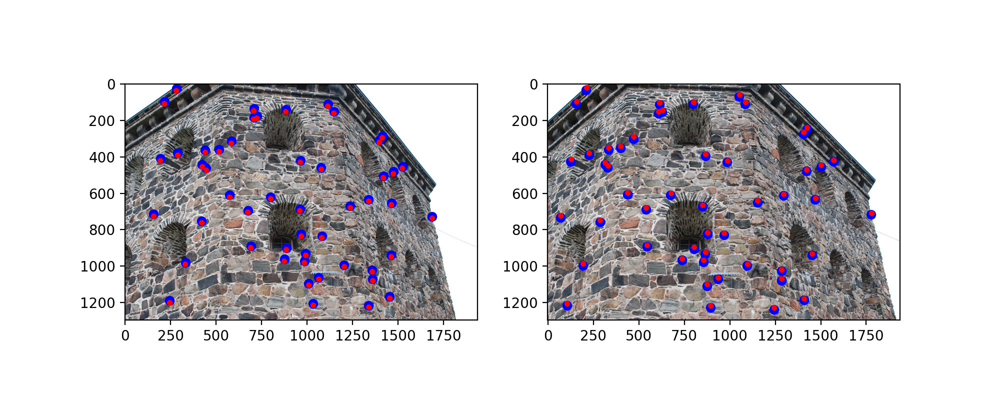

In [15]:
# Randomly select N=50 matches (pairs of features in two images) from the set of inliers for E
N = 50
ind_sample2 = np.random.choice(num_inliers, N, replace=False)

# Indicate (E) inlier matches in image 1 and image 2
plt.figure(11, figsize=(10, 4))
ax11_1 = plt.subplot(121)
plt.imshow(imL)
plt.plot(
    ptsL[ind[E_inliers][ind_sample2], 0],
    ptsL[ind[E_inliers][ind_sample2], 1],
    "ob",
)
ax11_2 = plt.subplot(122)
plt.imshow(imR)
plt.plot(
    ptsR[ind[E_inliers][ind_sample2], 0],
    ptsR[ind[E_inliers][ind_sample2], 1],
    "ob",
)

# project reconstructed 3D points onto both images and display them in red color
# a. convert correct points (Xa, Xb, Xc, or Xd) to homogeneous 4 vectors
X_correct = Xb[ind_sample2, :, 0]
homogeneous_X_correct = np.append(
    X_correct, np.ones(X_correct.shape[0])[:, None], axis=1
)
# b. project homogeneous 3D points (onto uncalibrated cameras) using correct Projection matrices (KPw and, e.g. KPa)
homogeneous_ptsL_proj = (K @ Pw @ homogeneous_X_correct.T).T
homogeneous_ptsR_proj = (K @ Pb @ homogeneous_X_correct.T).T
# c. convert to regular (inhomogeneous) point
ptsL_proj = np.delete(
    homogeneous_ptsL_proj / homogeneous_ptsL_proj[:, -1, None], -1, axis=1
)
ptsR_proj = np.delete(
    homogeneous_ptsR_proj / homogeneous_ptsR_proj[:, -1, None], -1, axis=1
)


ax11_1.plot(ptsL_proj[:, 0], ptsL_proj[:, 1], ".r")
ax11_2.plot(ptsR_proj[:, 0], ptsR_proj[:, 1], ".r")

plt.show()

## Question: how different are projected points for $SfM$ solutions a, b, c, and d? Explain. 

Answer:

If we always use **the corresponding world coordinates Xi with the projection matrices Pi** where i is either a, b, c or d, solutions A, B, C and D **all project correctly onto the right image**. Every red point in the right image would lie on the expected inlier match and the two images would have points with different image coordinate which correspond to the same world coordinate and the same point of the image. This makes sense because all the Xa, Xb, Xc, and Xd world coordinates were selected such that the least square error between corresponding matches of points was minimized. In this way, given a match (i.e. a pair of corresponding blue points), the world coordinate 3D point is selected such that when they are projected onto the images, the red points will match the blue points. This will be true regardless if the world coordinate points are way off as seen in the plotting of the 3D points in Part 10.

In fact, **Part 10 shows that only the solution B world coordinates made sense** given the shape of the points and the orientation of _both_ cameras on the plot. (Solution B was the right answer **in this run of the problem, but it may not always be the correct solution**). As such, if we used **the correct points Xb** with the **other A, C, and D projection matrices**, we would have observed **large errors** between the red points and blue points on the right image for every projection matrix except the one for solution B. **The errors from C and D would be substantial**, whereas **A would only have a translational error**. Only projection matrix B provides very accurate projection of the correct world points.

**For Part 11 above, the correct world coordinate 3D points Xb are shown the projection matrix B because they use the 3D points which make sense and the corresponding projection matrix**.

Finally, we notice that the projected 3D world points don't exactly coincide with the inlier matched points in Part 11. The left image red points are consistently lower than the blue points by a slight bit, the right image is consistently too high by a slight bit, indicating that the projection images have a slight error when projecting 3D world points onto their respect images. This makes sense because of the following sources of error:

First from Problem 6, we understand that we tried to get the 3D world coordinate which had the least square errors, but it may not minimize the error completely. Second, as good as the projection matrix B and by extension the essential matrix is, it was still just an attempt to create a projection matrix which minimizes the errors when projecting a 3D world point onto an image. These errors mean that when we take matched points, triangulate to get a 3D world point, and then project that 3D world point back onto the image, the projected points may not match the inlier points originally used. In fact, the best minimal non-zero error would have one ray slightly below and the other ray slightly above the true 3D world coordinate point, which can be seen in the images with the red dots which are either slightly below or above the blue points.

To complete the discussion, we show the errors in the results of the other A, C, and D projection matrices with the correct world coordinate 3D points Xb below:

<IPython.core.display.Javascript object>


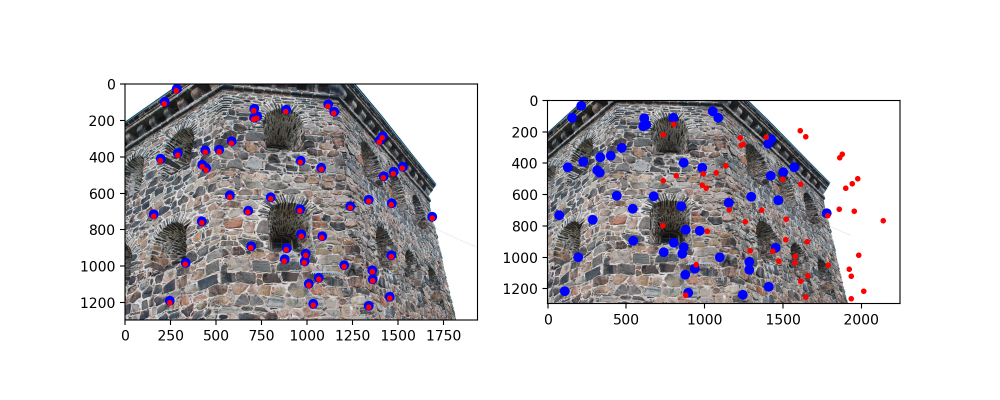

In [16]:
# Indicate (E) inlier matches in image 1 and image 2
plt.figure(12, figsize=(10, 4))
ax11_1 = plt.subplot(121)
plt.imshow(imL)
plt.plot(
    ptsL[ind[E_inliers][ind_sample2], 0],
    ptsL[ind[E_inliers][ind_sample2], 1],
    "ob",
)
ax11_2 = plt.subplot(122)
plt.imshow(imR)
plt.plot(
    ptsR[ind[E_inliers][ind_sample2], 0],
    ptsR[ind[E_inliers][ind_sample2], 1],
    "ob",
)

# project reconstructed 3D points onto both images and display them in red color
# a. convert correct points (Xa, Xb, Xc, or Xd) to homogeneous 4 vectors
X_correct = Xb[ind_sample2, :, 0]
homogeneous_X_correct = np.append(
    X_correct, np.ones(X_correct.shape[0])[:, None], axis=1
)
# b. project homogeneous 3D points (onto uncalibrated cameras) using correct Projection matrices (KPw and, e.g. KPa)
homogeneous_ptsL_proj = (K @ Pw @ homogeneous_X_correct.T).T
homogeneous_ptsR_proj = (K @ Pa @ homogeneous_X_correct.T).T
# c. convert to regular (inhomogeneous) point
ptsL_proj = np.delete(
    homogeneous_ptsL_proj / homogeneous_ptsL_proj[:, -1, None], -1, axis=1
)
ptsR_proj = np.delete(
    homogeneous_ptsR_proj / homogeneous_ptsR_proj[:, -1, None], -1, axis=1
)


ax11_1.plot(ptsL_proj[:, 0], ptsL_proj[:, 1], ".r")
ax11_2.plot(ptsR_proj[:, 0], ptsR_proj[:, 1], ".r")

plt.show()

<IPython.core.display.Javascript object>


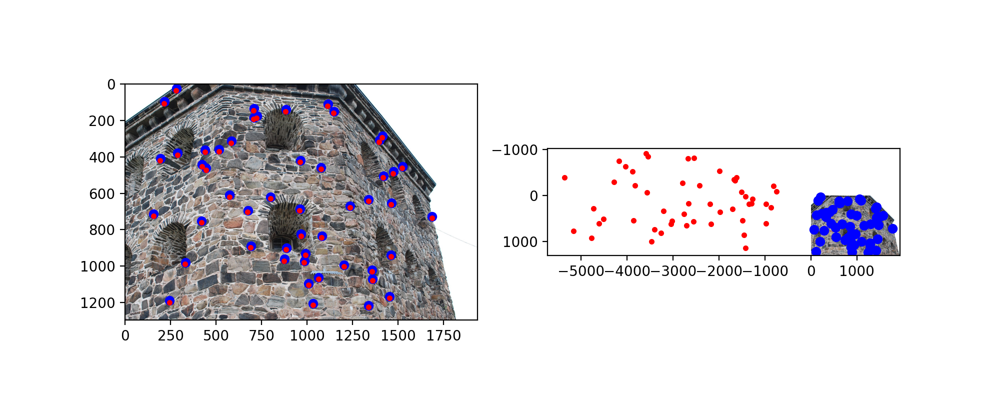

In [17]:
# Indicate (E) inlier matches in image 1 and image 2
plt.figure(13, figsize=(10, 4))
ax11_1 = plt.subplot(121)
plt.imshow(imL)
plt.plot(
    ptsL[ind[E_inliers][ind_sample2], 0],
    ptsL[ind[E_inliers][ind_sample2], 1],
    "ob",
)
ax11_2 = plt.subplot(122)
plt.imshow(imR)
plt.plot(
    ptsR[ind[E_inliers][ind_sample2], 0],
    ptsR[ind[E_inliers][ind_sample2], 1],
    "ob",
)

# project reconstructed 3D points onto both images and display them in red color
# a. convert correct points (Xa, Xb, Xc, or Xd) to homogeneous 4 vectors
X_correct = Xb[ind_sample2, :, 0]
homogeneous_X_correct = np.append(
    X_correct, np.ones(X_correct.shape[0])[:, None], axis=1
)
# b. project homogeneous 3D points (onto uncalibrated cameras) using correct Projection matrices (KPw and, e.g. KPa)
homogeneous_ptsL_proj = (K @ Pw @ homogeneous_X_correct.T).T
homogeneous_ptsR_proj = (K @ Pc @ homogeneous_X_correct.T).T
# c. convert to regular (inhomogeneous) point
ptsL_proj = np.delete(
    homogeneous_ptsL_proj / homogeneous_ptsL_proj[:, -1, None], -1, axis=1
)
ptsR_proj = np.delete(
    homogeneous_ptsR_proj / homogeneous_ptsR_proj[:, -1, None], -1, axis=1
)


ax11_1.plot(ptsL_proj[:, 0], ptsL_proj[:, 1], ".r")
ax11_2.plot(ptsR_proj[:, 0], ptsR_proj[:, 1], ".r")

plt.show()

<IPython.core.display.Javascript object>


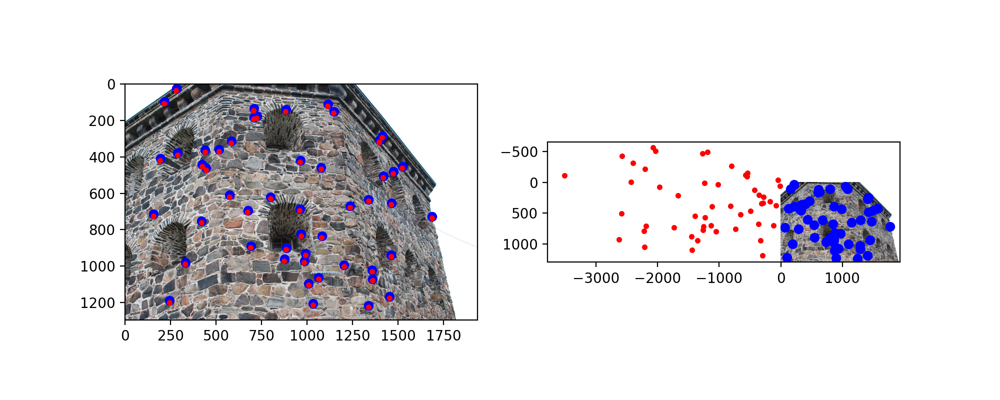

In [18]:
# Indicate (E) inlier matches in image 1 and image 2
plt.figure(14, figsize=(10, 4))
ax11_1 = plt.subplot(121)
plt.imshow(imL)
plt.plot(
    ptsL[ind[E_inliers][ind_sample2], 0],
    ptsL[ind[E_inliers][ind_sample2], 1],
    "ob",
)
ax11_2 = plt.subplot(122)
plt.imshow(imR)
plt.plot(
    ptsR[ind[E_inliers][ind_sample2], 0],
    ptsR[ind[E_inliers][ind_sample2], 1],
    "ob",
)

# project reconstructed 3D points onto both images and display them in red color
# a. convert correct points (Xa, Xb, Xc, or Xd) to homogeneous 4 vectors
X_correct = Xb[ind_sample2, :, 0]
homogeneous_X_correct = np.append(
    X_correct, np.ones(X_correct.shape[0])[:, None], axis=1
)
# b. project homogeneous 3D points (onto uncalibrated cameras) using correct Projection matrices (KPw and, e.g. KPa)
homogeneous_ptsL_proj = (K @ Pw @ homogeneous_X_correct.T).T
homogeneous_ptsR_proj = (K @ Pd @ homogeneous_X_correct.T).T
# c. convert to regular (inhomogeneous) point
ptsL_proj = np.delete(
    homogeneous_ptsL_proj / homogeneous_ptsL_proj[:, -1, None], -1, axis=1
)
ptsR_proj = np.delete(
    homogeneous_ptsR_proj / homogeneous_ptsR_proj[:, -1, None], -1, axis=1
)


ax11_1.plot(ptsL_proj[:, 0], ptsL_proj[:, 1], ".r")
ax11_2.plot(ptsR_proj[:, 0], ptsR_proj[:, 1], ".r")

plt.show()